# Task 2. Computer Vision. Keypoints matching on satellite photos.

We need to train the model for choosing keypoints, matching keypoints and visualisation keypoints on a satellite photos. 

In [20]:
import numpy as np 
import pandas as pd
import geopandas as gpd

import os, fnmatch

import rasterio
from rasterio.plot import reshape_as_image
from rasterio.features import rasterize

from shapely.geometry import mapping, Point, Polygon
from shapely.ops import cascaded_union, unary_union

import matplotlib.pyplot as plt

# Praparing of dataset

Use dataset on Kaggle

https://www.kaggle.com/datasets/isaienkov/deforestation-in-ukraine

The dataset contains satellite photographs of the region at different times of the year. There are both optical satellite photographs and photographs in various infrared and ultraviolet ranges.

## Problem.

Satellite images are large enough to provide a detailed image of the earth's surface. But because of this, the processing time of photos by algorithms increases.

Possible solution: degrade image quality by blurring and other means. Blurring can reduce the accuracy of keypoint recognition and matching. We will not use this method for now.

## Solution

Of the possible solutions, we chose the simplest one as the base one: from all types of satellite photographs, select only those that weigh the least. These are files that end with ...B09. If the recognition accuracy is insufficient, you can take files of a different type.

### We get a list of files containing B09:

In [21]:
pattern = "*UYA*B09.jp2" # use pattern for define needed type of image and needed type of location

list_of_files = []

for root, dirs, files in os.walk(PATH):
    for filename in files:
        if fnmatch.fnmatch(filename, pattern):
            list_of_files.append((root, filename)) # create the list of paths and files

In [22]:
list_of_files

[('/kaggle/input/deforestation-in-ukraine/S2A_MSIL1C_20160212T084052_N0201_R064_T36UYA_20160212T084510/S2A_MSIL1C_20160212T084052_N0201_R064_T36UYA_20160212T084510.SAFE/GRANULE/L1C_T36UYA_A003350_20160212T084510/IMG_DATA',
  'T36UYA_20160212T084052_B09.jp2'),
 ('/kaggle/input/deforestation-in-ukraine/S2A_MSIL1C_20160621T084012_N0204_R064_T36UYA_20160621T084513/S2A_MSIL1C_20160621T084012_N0204_R064_T36UYA_20160621T084513.SAFE/GRANULE/L1C_T36UYA_A005209_20160621T084513/IMG_DATA',
  'T36UYA_20160621T084012_B09.jp2'),
 ('/kaggle/input/deforestation-in-ukraine/S2B_MSIL1C_20190313T083739_N0207_R064_T36UYA_20190313T122406/S2B_MSIL1C_20190313T083739_N0207_R064_T36UYA_20190313T122406.SAFE/GRANULE/L1C_T36UYA_A010529_20190313T083842/IMG_DATA',
  'T36UYA_20190313T083739_B09.jp2'),
 ('/kaggle/input/deforestation-in-ukraine/S2B_MSIL1C_20190611T083609_N0207_R064_T36UYA_20190611T122426/S2B_MSIL1C_20190611T083609_N0207_R064_T36UYA_20190611T122426.SAFE/GRANULE/L1C_T36UYA_A011816_20190611T084501/IMG_DATA

We look through the files and determine which of them are not very noisy with clouds and other interference.

20160212


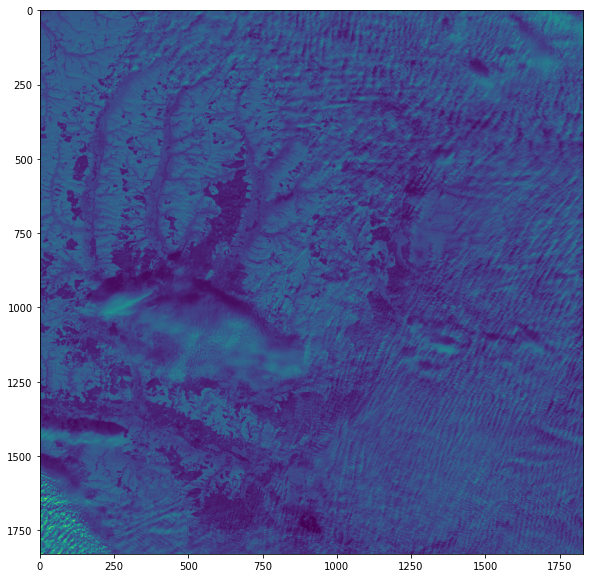

20160621


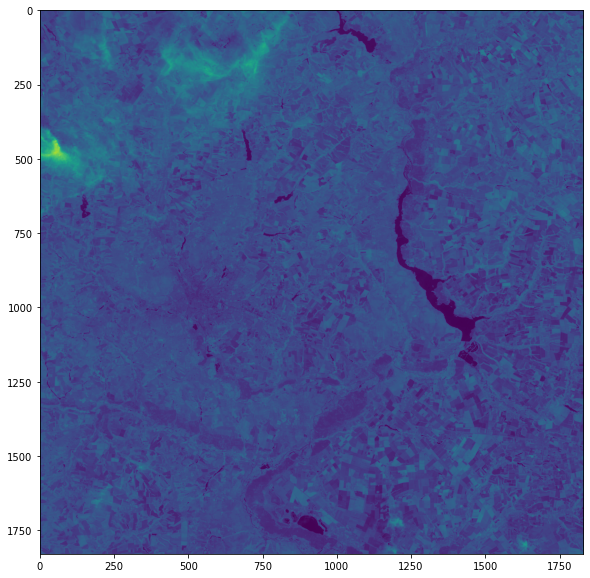

20190313


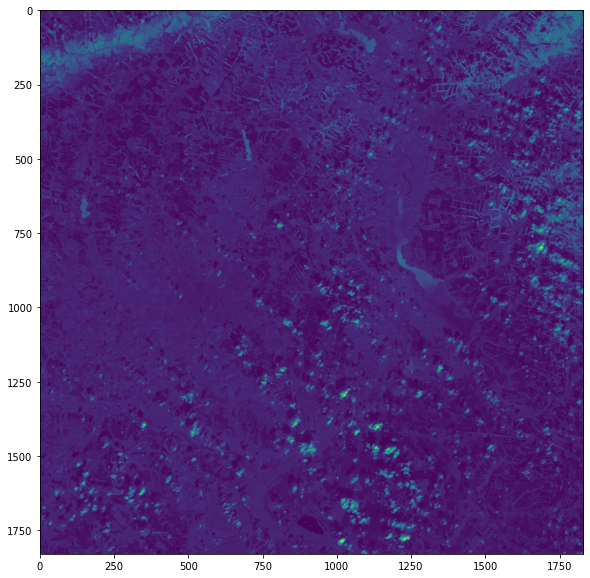

20190611


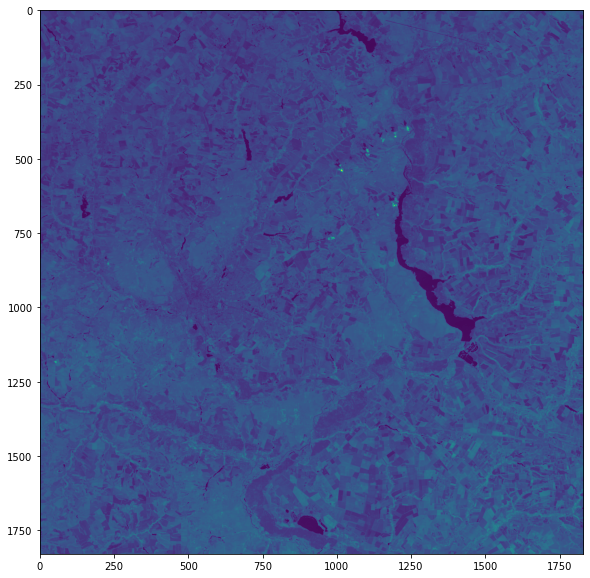

20190701


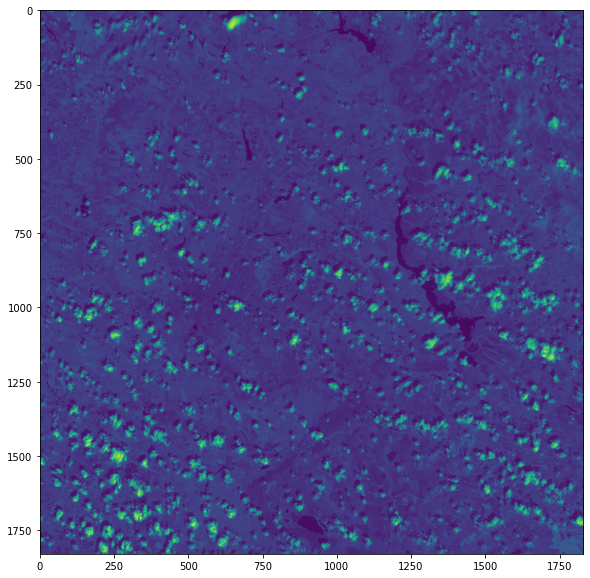

20190721


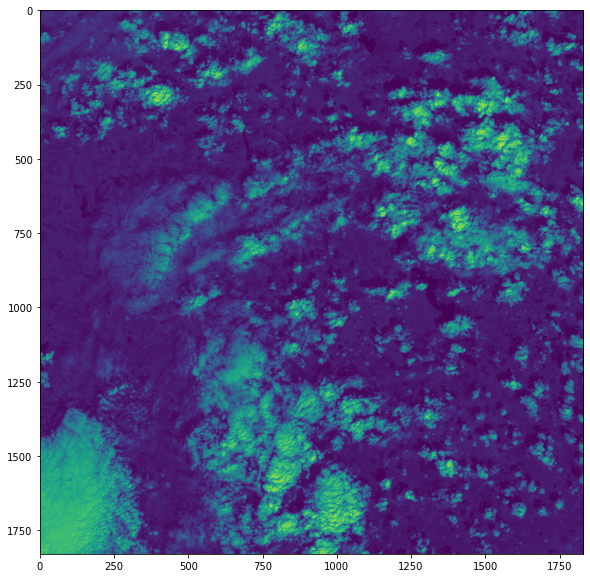

20190621


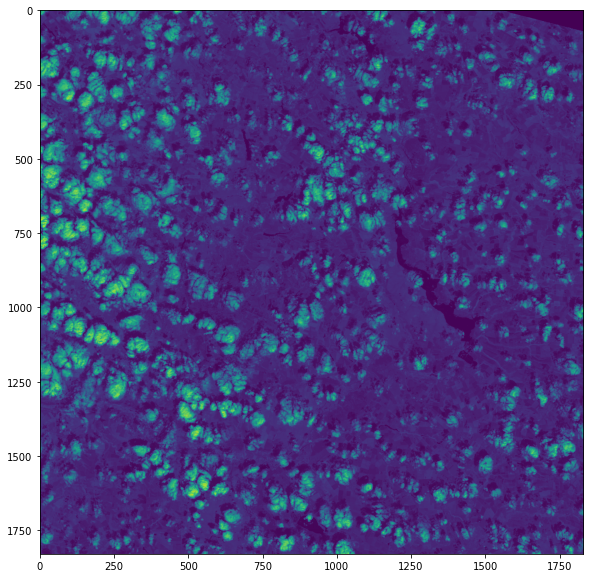

20190825


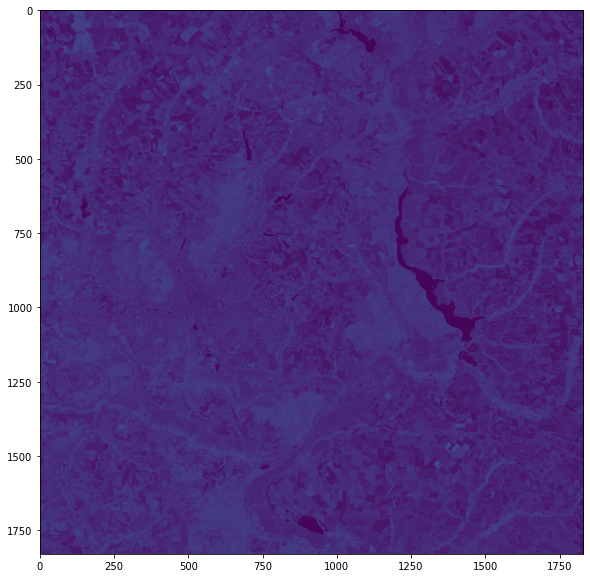

20190318


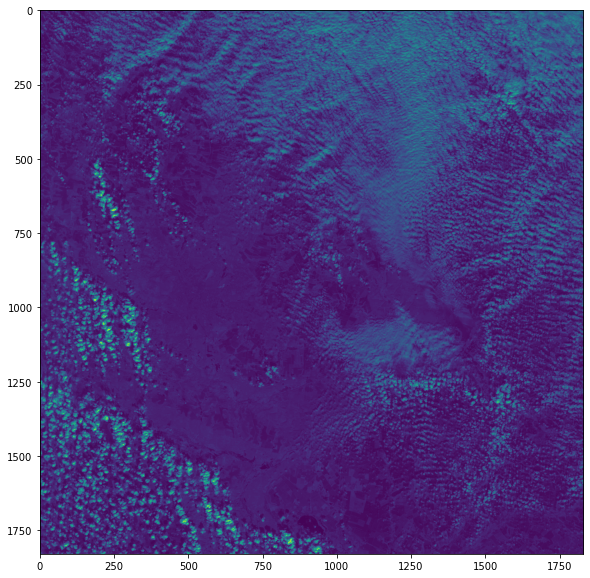

20190706


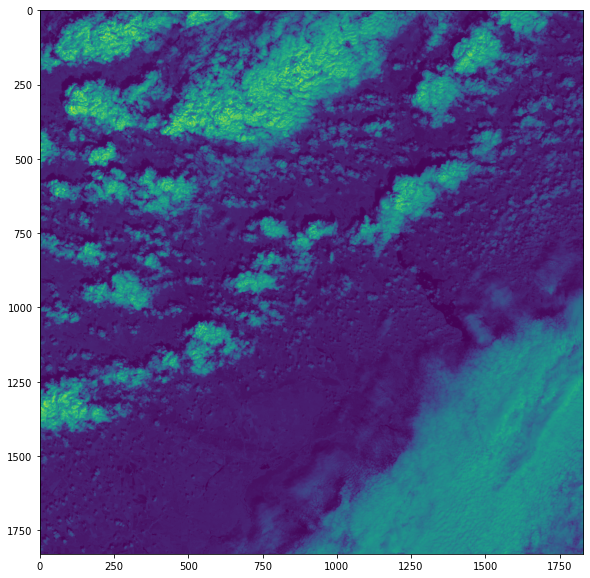

20160509


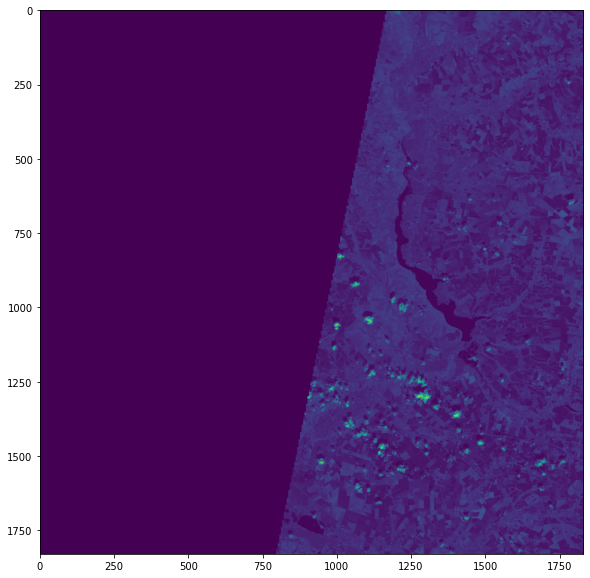

20190815


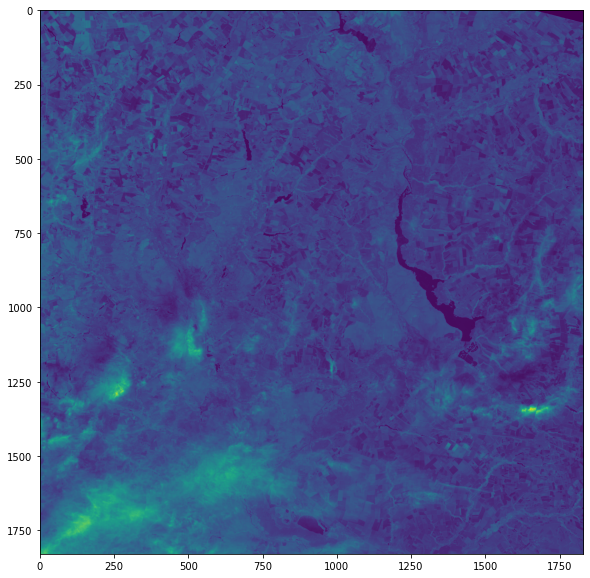

20190412


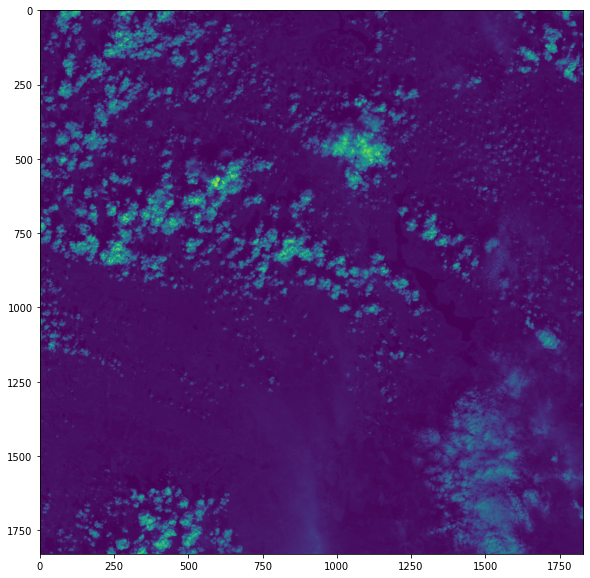

20190616


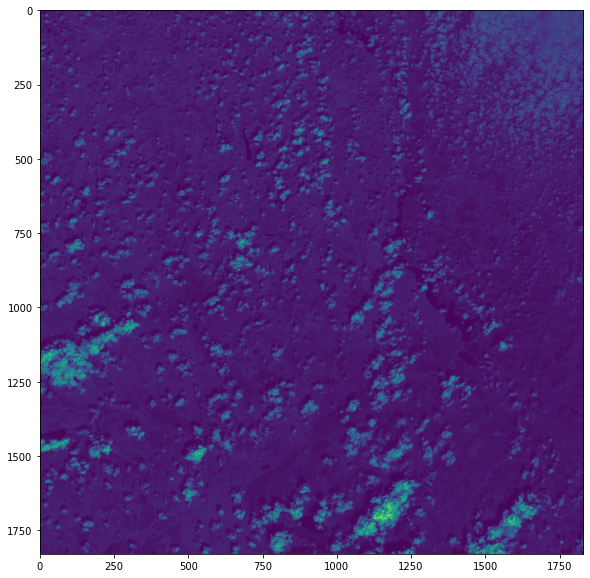

20190328


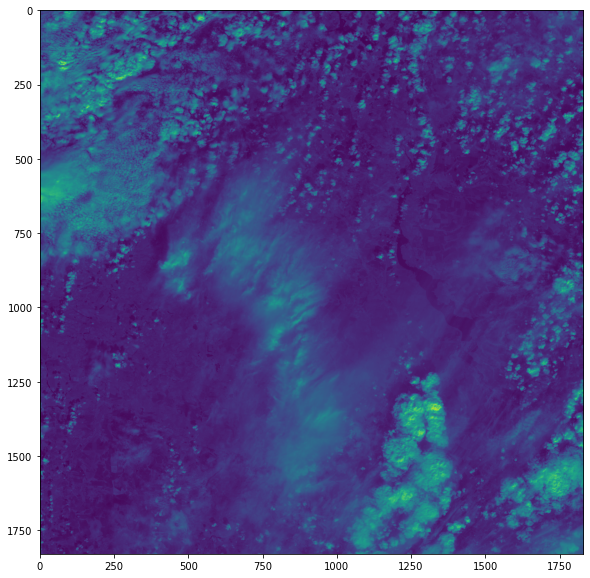

20190402


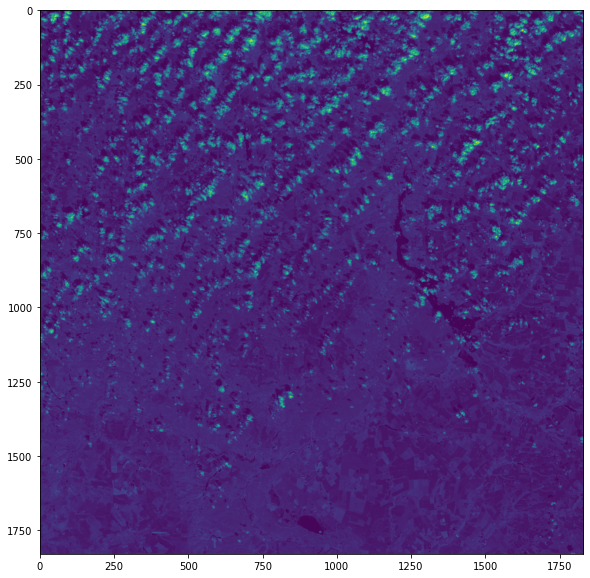

20190909


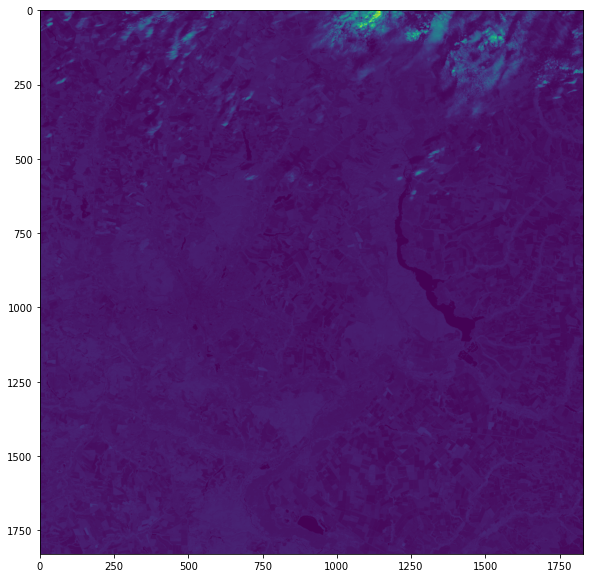

20160830


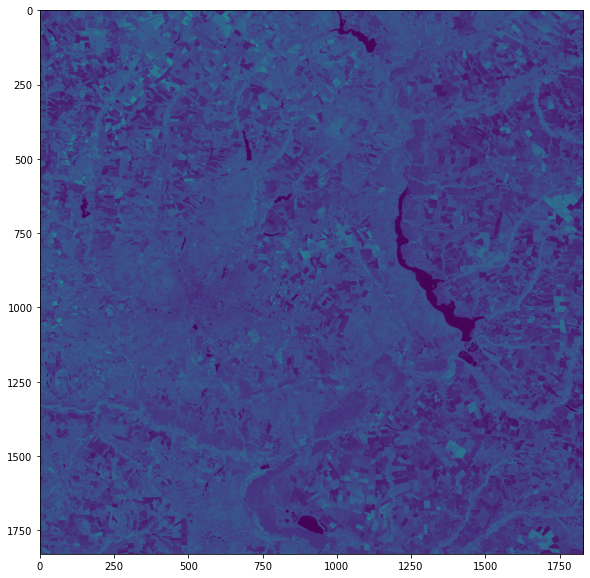

20190726


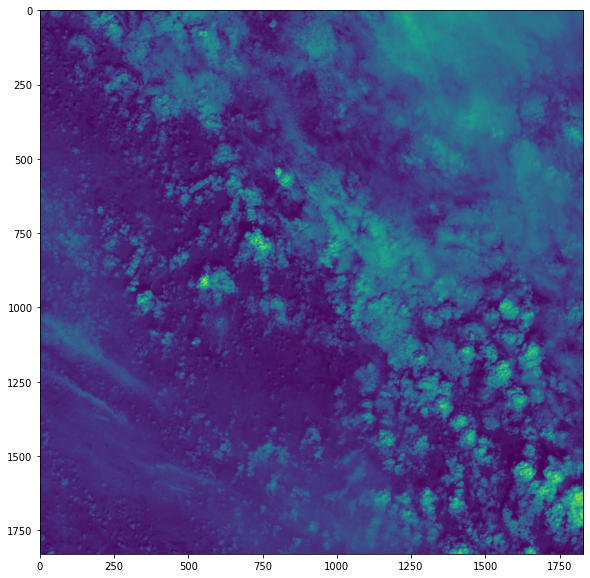

20160330


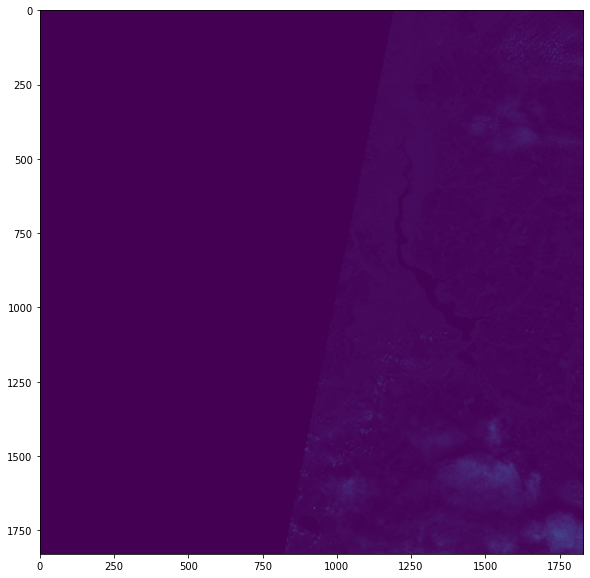

20190517


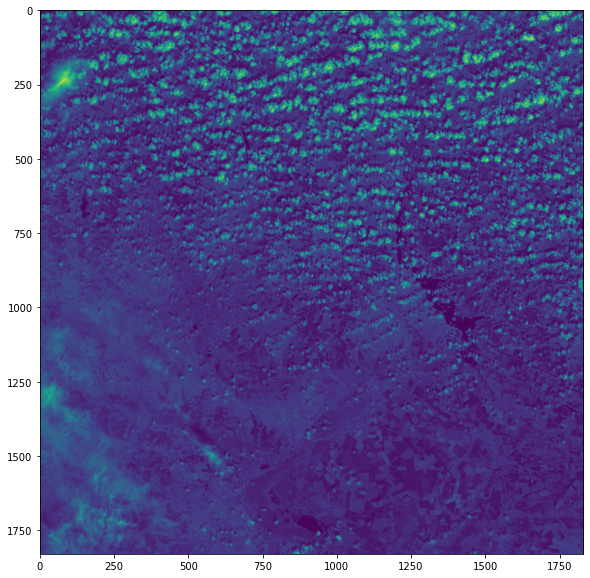

20160405


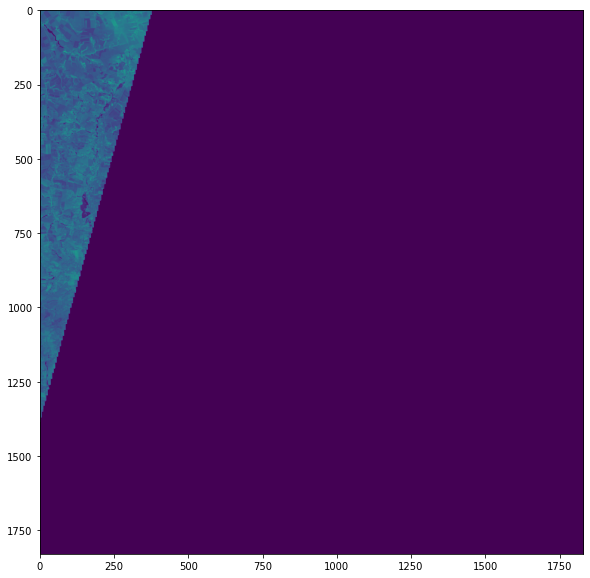

20190422


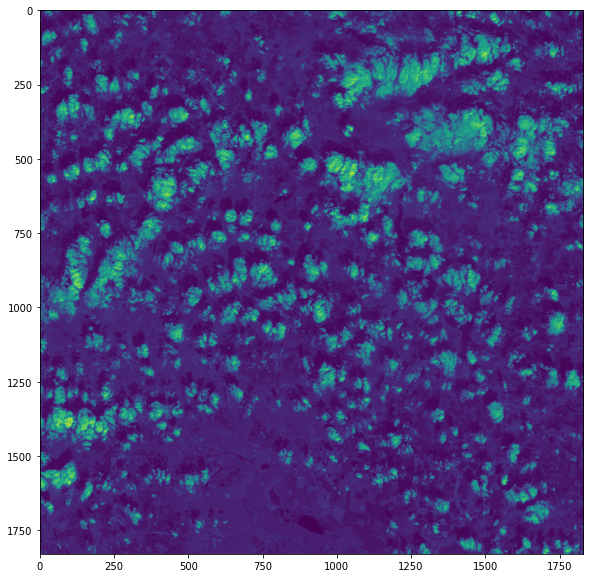

20160618


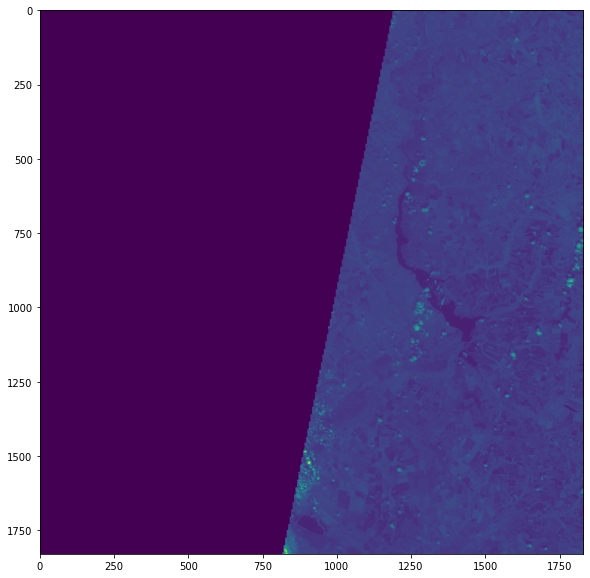

20161121


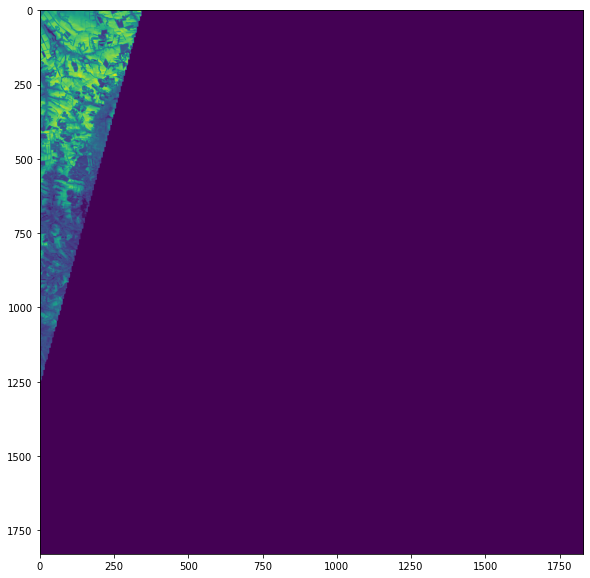

20190601


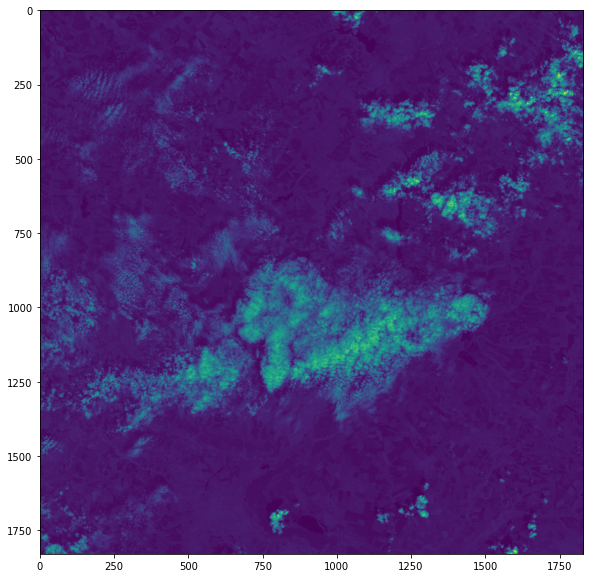

20190830


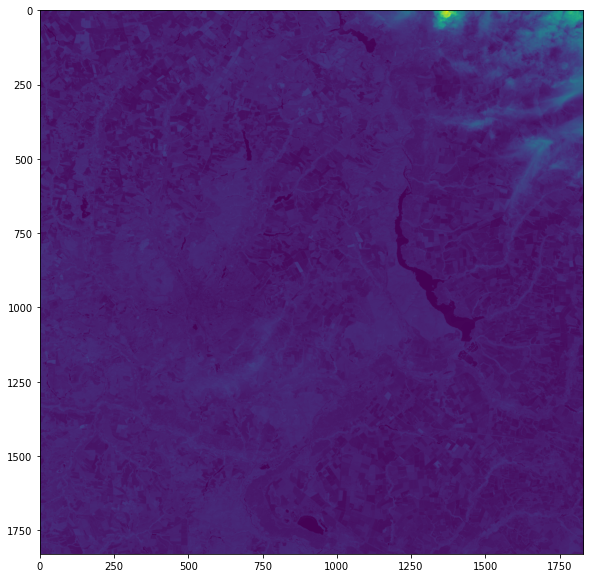

20161026


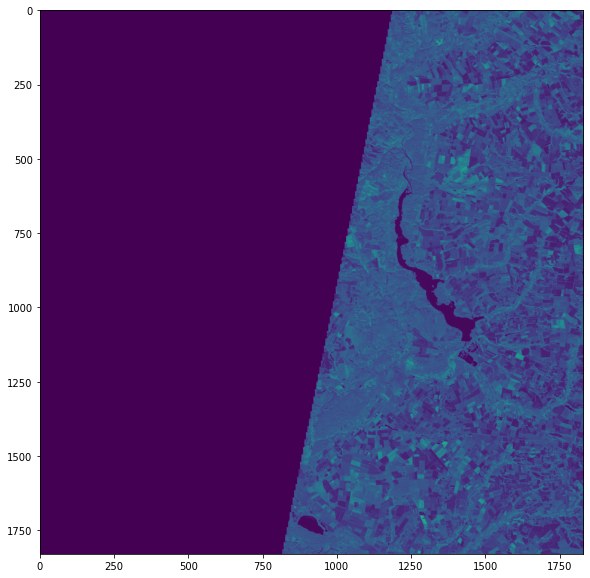

20190427


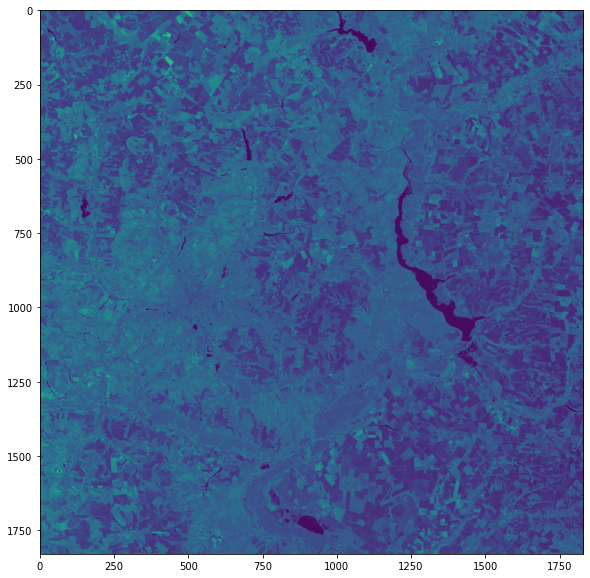

20190810


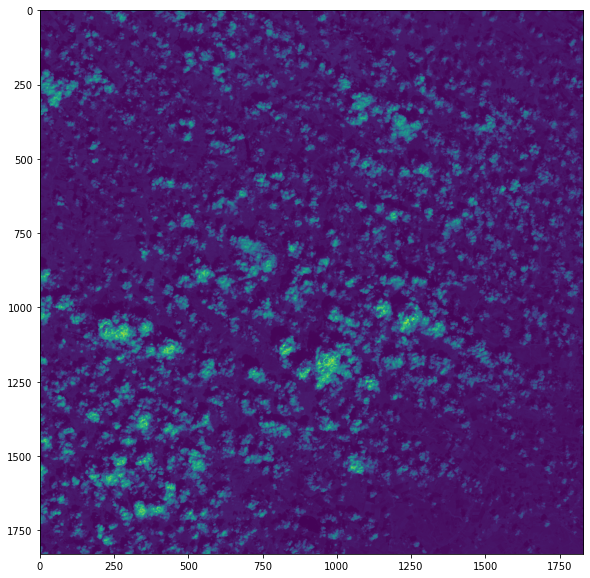

20160502


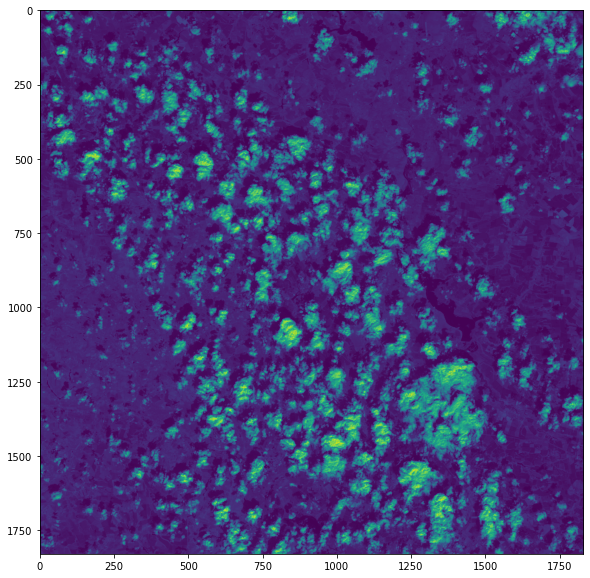

20161205


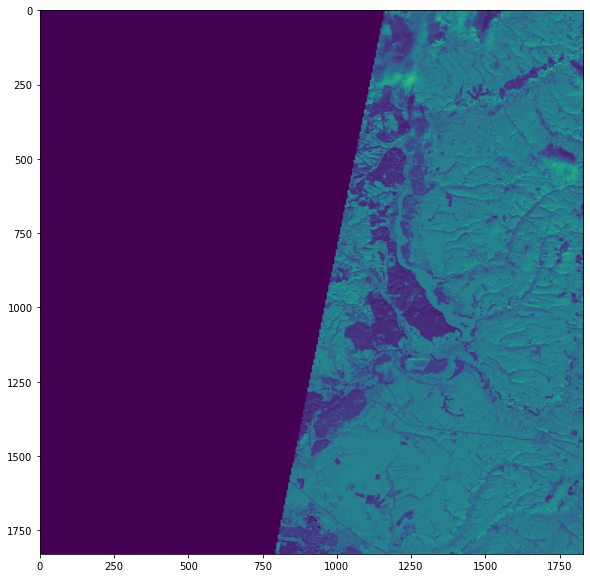

20190904


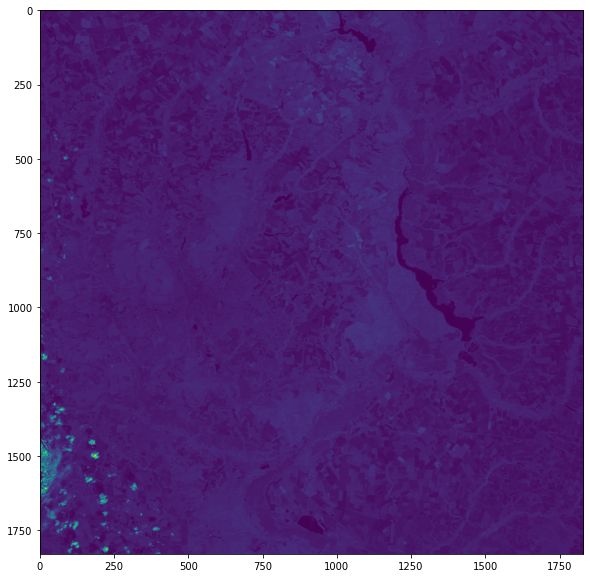

20190606


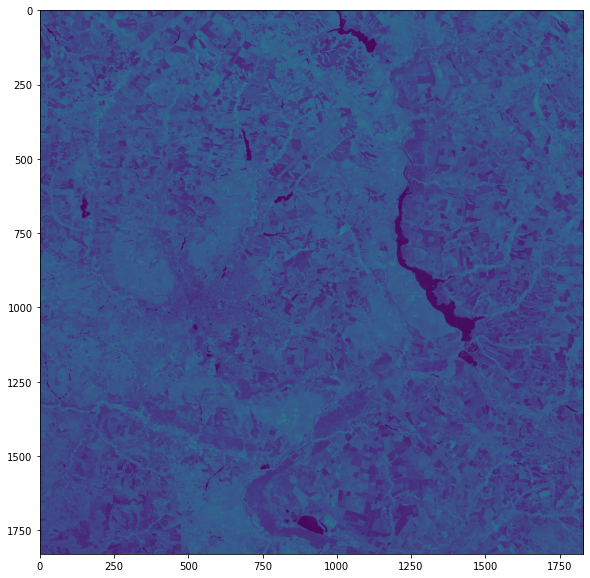

20190626


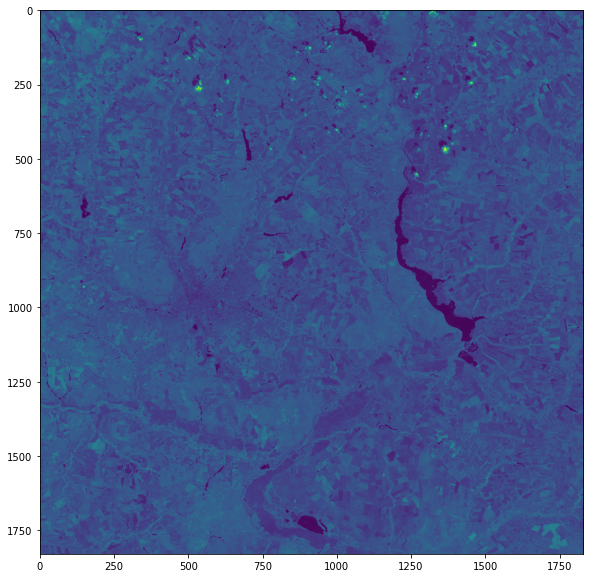

20190417


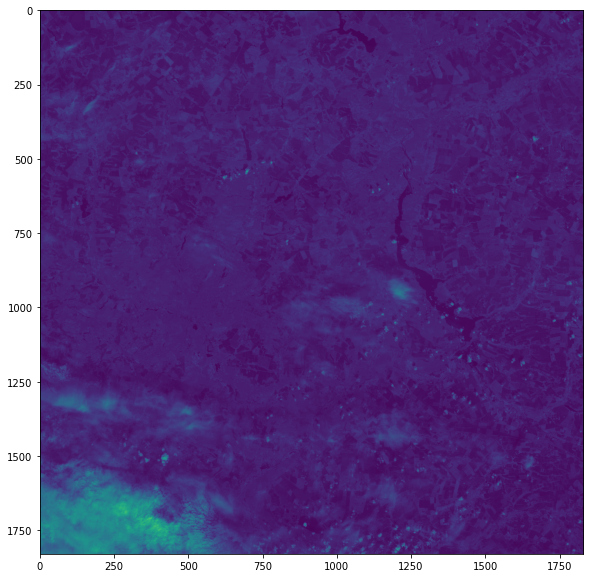

20190805


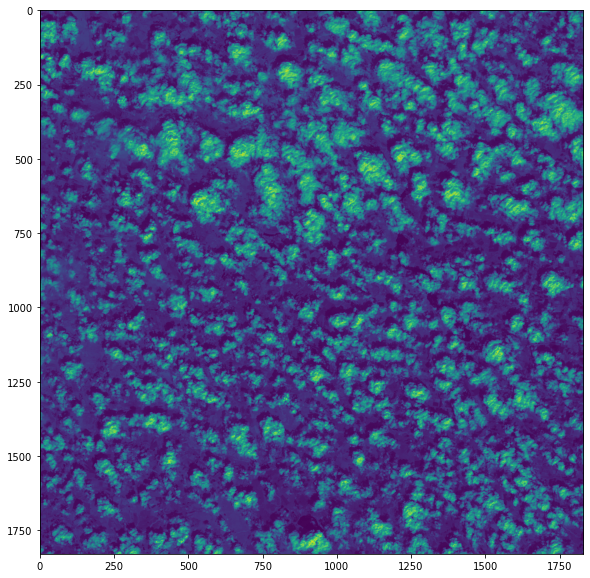

20190407


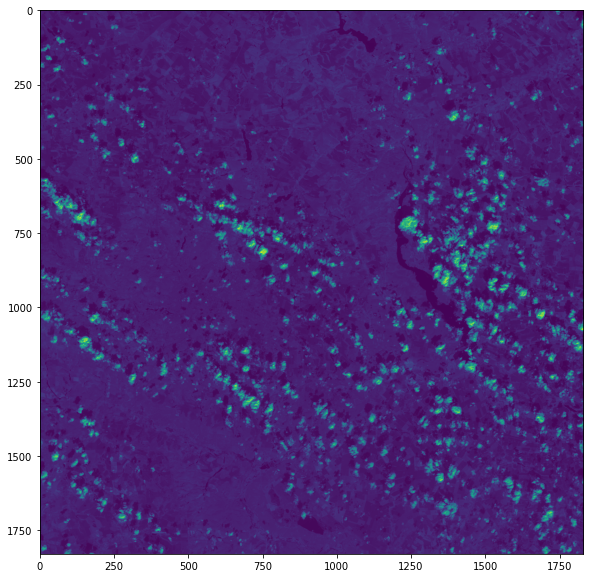

In [23]:
for root, filename in list_of_files: 
    raster_path = root + '/' + filename # create a working path
    with rasterio.open(raster_path, "r", driver='JP2OpenJPEG') as src:
        raster_image = src.read() # read the image
    
    raster_img = reshape_as_image(raster_image)
    print(filename[7:15]) # take a year and month of image
    plt.figure(figsize=(10, 10))
    plt.imshow(raster_img)
    plt.show()

We make a list of “good” files and paths to them:

In [24]:
images = []
choose = ['20160621', '20190611', '20190825', '20160509', '20190815', '20190909' , '20160830', '20160330', 
          '20160618', '20190830', '20161026', '20190427', '20190904', '20190606', '20190626', '20190417'] # choosen files
for d, f in list_of_files:
    for c in choose: 
        if c in f:
            images.append((d, f))

The database is ready, let's move on to comparing key points.